#Script Assignment 2
#Angel Argueta, Creston Altiere, Sahar Sheikholeslami , Wessley Dennis

## ▚▚ Data Collection ▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚
##1. Data Collection: Use any publicly available dataset containing a collection of technology-related news articles in a JSON format. Load the dataset and inspect its structure.

### Importing Necessary libraries

In [144]:
pip install numpy

In [145]:
pip install langid

In [146]:
pip install pyLDAvis

In [147]:
pip install --upgrade ipykernel


In [148]:
import nltk
import pandas as pd
import numpy as np
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer
from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer
import json
import langid
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
import spacy
import pyLDAvis
import pyLDAvis.gensim
from IPython.core.display import HTML
from nltk.stem.lancaster import LancasterStemmer
import string
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib
import seaborn as sns
import gensim.corpora as corpora


In [149]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [150]:
import os
os.chdir('/content/drive/MyDrive/NLP')

In [151]:

# Loading json
with open('Science_Technology_News.json', encoding='utf-8') as f:
    data = json.load(f)

# Main dataframe
df = pd.json_normalize(data)

# Printing Main dataframe structure
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5437 entries, 0 to 5436
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   title             5437 non-null   object
 1   link              5437 non-null   object
 2   keywords          2502 non-null   object
 3   creator           2610 non-null   object
 4   video_url         0 non-null      object
 5   description       4936 non-null   object
 6   content           1627 non-null   object
 7   pubDate           5437 non-null   object
 8   full_description  2670 non-null   object
 9   image_url         2169 non-null   object
 10  source_id         5437 non-null   object
dtypes: object(11)
memory usage: 467.4+ KB
None


In [152]:
df.head()

,title,link,keywords,creator,video_url,description,content,pubDate,full_description,image_url,source_id
0,OPPO Reno6 5G Recensione: uno smartphone elega...,https://tech.everyeye.it/articoli/recensione-o...,[Oppo Reno6],[Andrea Zanettin],None,OPPO Reno6 5G è un dispositivo che farà piacer...,None,2021-10-26 09:12:00,None,https://images.everyeye.it/img-articoli/oppo-r...,everyeye
1,Un artista smonta Xiaomi MIX Fold: il risultat...,https://gizchina.it/2021/10/xiaomi-mi-mix-fold...,"[Notizie, Xiaomi, XIAOMI, Xiaomi Mi MIX Fold, ...",[Michele Perrone],None,Uno smartphone pieghevole come Xiaomi MIX Fold...,Uno smartphone pieghevole come Xiaomi MIX Fold...,2021-10-26 09:11:35,Uno smartphone pieghevole come Xiaomi MIX Fold...,None,gizchina
2,"WHO: Staaten nicht in der Lage, Pandemie bald ...",https://futurezone.at/science/who-corona-covid...,[Science],None,None,Laut Expertenbericht der Weltgesundheitsorgani...,None,2021-10-26 09:07:32,None,https://image.futurezone.at/images/original/64...,futurezone
3,Google Pay már az Erste Banknál is,https://www.hwsw.hu/hirek/63921/erste-bank-goo...,None,[HWSW],None,Mától a magyar Erste Bank kártyáival is elérhe...,Mától a magyar Erste Bank kártyáival is elérhe...,2021-10-26 09:05:54,Mától az Erste Bank kártyáival is elérhető a G...,None,hwsw
4,Antipasto di Black Friday su Amazon: che scont...,https://tech.everyeye.it/notizie/antipasto-bla...,[Volantino e Offerte Tech],[Alessio Marino],None,Amazon ci dà un antipasto del Black Friday con...,None,2021-10-26 09:05:00,None,https://images.everyeye.it/img-notizie/antipas...,everyeye


In [153]:
df.tail()

,title,link,keywords,creator,video_url,description,content,pubDate,full_description,image_url,source_id
5432,The creators of No Extra Heroes grow to be a p...,https://thenewstrace.com/the-creators-of-no-ex...,[Tech],[Kim Diaz],None,Suda51 welcomes the deal and is assured that i...,None,2021-10-24 09:49:36,NaN,None,thenewstrace
5433,"Référence des antivirus sur Mac, Intego sabre ...",https://www.journaldugeek.com/2021/10/24/refer...,"[Offres, Bons plans]",[Redac JDGe],None,"Ce week-end, on retrouve la même offre chez In...",None,2021-10-24 09:45:46,None,None,journaldugeek
5434,Roblox ha raggiunto 3 miliardi di account crea...,http://multiplayer.it/notizie/roblox-ha-raggiu...,None,None,None,Roblox continua a crescere e ha recentemente r...,None,2021-10-24 09:43:34,Roblox si conferma sempre più il gioco dei rec...,None,multiplayer
5435,Pożar drewnianej parafii w Studzienicznej,https://wiadomosci.onet.pl/bialystok/pozar-dre...,None,None,None,None,- Praktycznie cały budynek plebanii uległ spal...,2021-10-24 09:42:02,NaN,None,wiadomosci
5436,"Mesajul WhatsApp pentru Oameni, ce NU Stiau ca...",https://www.idevice.ro/2021/10/24/mesajul-what...,"[aplicatii, important, Noutati, tehnologie, Wh...",[Adrian Gabor],None,WhatsApp transmite un nou mesaj oficial import...,None,2021-10-24 09:40:40,NaN,None,idevice


In [154]:
df.describe()

,title,link,keywords,creator,video_url,description,content,pubDate,full_description,image_url,source_id
count,5437,5437,2502,2610,0,4936,1627,5437,2670,2169,5437
unique,5255,5434,1661,942,0,4799,1589,4598,2651,2110,292
top,Social Media: Weitere interne Dokumente verstä...,https://9to5google.com/2021/10/25/pixel-6-pro-...,[Tech],[Kim Diaz],NaN,… Read More,(Auf https://www.watson.ch lesen),2021-10-25 16:00:00,L' annonce d’un partenariat entre le français ...,https://www.lastampastatic.it/cless/lastampa/2...,google
freq,6,2,119,44,NaN,16,6,33,2,17,382


In [155]:
## Make a copy before we start working with original dataset

In [156]:
dfcopy=df.copy()

In [157]:
df.shape

(5437, 11)

### As it can be seen above we have about 200 duplicate values beyween descriptions and titles

### Drop Duplicates
### See which descriptions are idendential

In [158]:
df = df.drop_duplicates('description', keep='last')

In [159]:
df.shape

(4800, 11)

In [160]:
df = df.drop_duplicates('title', keep='last')

In [161]:
df.shape

(4746, 11)

### Data sized was reduce by almost 600  by removing duplicates

### Study N/A Values

In [162]:
num_none_col1 = df.isna().sum()

In [163]:
print(num_none_col1)

title                  0
link                   0
keywords            2341
creator             2422
video_url           4746
description            1
content             3582
pubDate                0
full_description    2343
image_url           2804
source_id              0
dtype: int64


### Looking at above we can drop video_url feature as it is almost entirely N/A.  Rewt of data such as content and creator keywords etc have a larger amount of missing data.  I think since the description and title matter the most the rows that have both can remain

### Pubdate scales seem to vary too much from cell. Lets study

In [164]:
df['pubDate'].describe()


count                    4746
unique                   4145
top       2021-10-25 16:00:00
freq                       25
Name: pubDate, dtype: object

### as it can be seen above this data has over 4100 unique features. This col is not very dependant on others. Think of this like employee id etc. A number that does not carry a meanging

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:1281: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(aggregator, agg_var)


<Axes: ylabel='pubDate'>

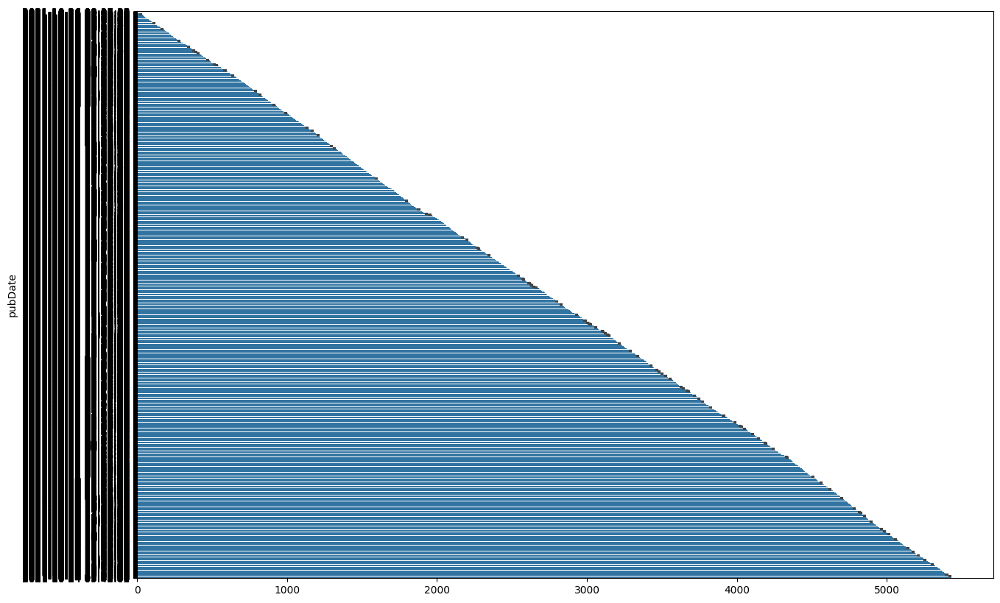

In [165]:
sns.barplot(df['pubDate'])


## ▚▚ Information Extraction ▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚
## 2. Information Extraction: Extract relevant information from each news article, such as the title, publication date, author, and content. Clean and preprocess the text data by removing stopwords, and punctuation, and performing stemming or lemmatization.

In [166]:
# 2. Information Extraction -----------------------------------------------------------------

# Extracting relevant fields
df = df[['title', 'description']].copy()

# Filtering out non-English articles ------------------------------------------
def englishfilter(text):
    if pd.isna(text):
        return "other"
    else:
        return langid.classify(text)[0]
df['language'] = df['description'].apply(englishfilter)
df = df[df['language'] == 'en']
df.drop('language', axis=1, inplace=True)
#-----------------------------------------------------------------------------



/tmp/ipykernel_2414/2176701236.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop('language', axis=1, inplace=True)


In [167]:
import nltk
nltk.download('stopwords')
nltk.download('wordnet') # we will use wordnet lemmatizer
nltk.download('averaged_perceptron_tagger') #to be used for tagger
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [168]:

# Preprocessing
from nltk.stem.lancaster import LancasterStemmer
import string
from nltk.corpus import wordnet
stop_words = stopwords.words('english')
stemmer = SnowballStemmer('english')
tokenizer = RegexpTokenizer(r'\w+')
lemmatizer = WordNetLemmatizer()


def get_wordnet_pos(word):
    """Map POS tag to first character lemmatize() accepts"""
    tag = nltk.pos_tag([word])[0][1][0].lower()
    tag_dict = {"a": wordnet.ADJ,
                "n": wordnet.NOUN,
                "v": wordnet.VERB,
                "r": wordnet.ADV}
    return tag_dict.get(tag, wordnet.NOUN)
def preprocess(text):
      # Check characters to see if they are in punctuation


    if text:

        text1 = [char for char in text if char not in string.punctuation]
          ## Get the numbers out
        text1 = [c for c in text1 if not c.isdigit()]


        # Join the characters again to form the string.
        text1 = ''.join(text1)
        # output = ''.join(c for c in text if not c.isdigit())

    #Tokenization

        tokens = tokenizer.tokenize(text1.lower())
        extrawords = ["th", "one","two", "g", "de", "got", "go","q","k",]
        stop_words.extend(extrawords)

        filtered_tokens = [word for word in tokens if word not in stop_words]
        stemmed_tokens = [stemmer.stem(word) for word in filtered_tokens]
        return " ".join(stemmed_tokens)
    return ""

def preprocess_lemmatize(text):
    if text:
        tokens = tokenizer.tokenize(text.lower())
        filtered_tokens = [word for word in tokens if word not in stop_words]
        lemmed_tokens = [lemmatizer.lemmatize(word, pos=get_wordnet_pos(word)) for word in filtered_tokens]
        return " ".join(lemmed_tokens)
    return ""





In [169]:
df['AllText'] = df['title'] + ' ' +  df['description']

In [170]:
# Applying preprocessing to content field
df['processed_content_stemmed'] = df['AllText'].apply(preprocess)

# Applying preprocessing to content field
df['processed_content_lemmed'] = df['processed_content_stemmed'].apply(preprocess_lemmatize)

In [171]:
df.head()

,title,description,AllText,processed_content_stemmed,processed_content_lemmed
5,Top tips: How to keep black clothes looking th...,“Everyone I know has a closet full of black cl...,Top tips: How to keep black clothes looking th...,top tip keep black cloth look best longer ever...,top tip keep black cloth look best longer ever...
17,Phone and internet lines down after Sudan mili...,Telecommunications have been interrupted in Su...,Phone and internet lines down after Sudan mili...,phone internet line sudan militari coup teleco...,phone internet line sudan militari coup teleco...
19,TLcom and 4DX drive $13.1M seed round to scale...,African automotive company Autochek has secure...,TLcom and 4DX drive $13.1M seed round to scale...,tlcom dx drive seed round scale autochek platf...,tlcom dx drive seed round scale autochek platf...
22,Can an app help the homeless?,How can a mobile app make life better for a pe...,Can an app help the homeless? How can a mobile...,app help homeless mobil app make life better p...,app help homeless mobil app make life well per...
25,SpaceX’s newest Crew Dragon spacecraft arrives...,"Right on schedule, SpaceX has rolled a new Cre...",SpaceX’s newest Crew Dragon spacecraft arrives...,spacex newest crew dragon spacecraft arriv lau...,spacex newest crew dragon spacecraft arriv lau...


In [172]:
# Printing Main dataframe structure
print(df.info())

<class 'pandas.core.frame.DataFrame'>
Index: 2012 entries, 5 to 5432
Data columns (total 5 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   title                      2012 non-null   object
 1   description                2012 non-null   object
 2   AllText                    2012 non-null   object
 3   processed_content_stemmed  2012 non-null   object
 4   processed_content_lemmed   2012 non-null   object
dtypes: object(5)
memory usage: 94.3+ KB
None


In [173]:
# Printing preprocessed content
print(df['processed_content_stemmed'].head())
print(df['processed_content_lemmed'].tail())

5     top tip keep black cloth look best longer ever...
17    phone internet line sudan militari coup teleco...
19    tlcom dx drive seed round scale autochek platf...
22    app help homeless mobil app make life better p...
25    spacex newest crew dragon spacecraft arriv lau...
Name: processed_content_stemmed, dtype: object
5411    longterm test introduct outland phev black edi...
5412    xbox game studio spotlight tango gamework meet...
5419    sunday paper sunday near heart attack toaster ...
5423    look insid appl silicon playbook appl exec tal...
5432    creator extra hero grow part chine languag cor...
Name: processed_content_lemmed, dtype: object


In [174]:
## Topic Modeling ----------------------------------------------------------------------------------------------------------

# Restructuring of the data is nessecary
# will be using the lammetized data (better for topic modeling)
# will be dropping all Nan values for data uniformity
# will be combining titles, dates, etc for training
unframed_data= df['processed_content_stemmed'].dropna().values.tolist()
# unframed_data = df.drop(["content", "processed_content_stemmed"], axis=1).dropna().values.tolist()

# set up text_corpus
# text_corpus = []
new_article = []

for article in unframed_data:
    # new_article = []
    new_article.append(article.split(" "))
    # print(new_article)
    # new_article = new_article + article[1].split(" ")
    # new_article = new_article + article[2][0].split(" ")
    # new_article = new_article[0] + article[3].split(" ")
    # text_corpus.append(new_article)

# suppressed, for debugging purposes only
# print(text_corpus[0])

In [175]:
new_article[:1]

[['top',
  'tip',
  'keep',
  'black',
  'cloth',
  'look',
  'best',
  'longer',
  'everyon',
  'know',
  'closet',
  'full',
  'black',
  'cloth',
  'wrote',
  'late',
  'writer',
  'director',
  'nora',
  'ephron',
  'essay',
  'call',
  'mainten',
  'like',
  'propag',
  'clich',
  'request',
  'tip',
  'prevent',
  'black',
  'cloth',
  'fade',
  'far',
  'outnumb',
  'other',
  'seri',
  'expert',
  'advic',
  'maintain',
  'black',
  'item',
  'wardrob',
  'ephron',
  'wrote',
  'black',
  'make',
  'life',
  'much',
  'simpler',
  'everyth',
  'match',
  'black',
  'especi',
  'black',
  'wash',
  'less',
  'care',
  'salli',
  'hugh',
  'founder',
  'kair',
  'laundri',
  'product',
  'say',
  'prevent',
  'black',
  'cloth',
  'fade',
  'wash',
  'machin',
  'set',
  'key',
  'want',
  'agit',
  'garment',
  'littl',
  'possibl',
  'recommend',
  'turn',
  'garment',
  'insid',
  'wash',
  'cold',
  'gentl',
  'cycl',
  'liquid',
  'deterg',
  'avoid',
  'tumbl',
  'dri',
  '

In [176]:
# Perform mapping of ID to words
id2word = corpora.Dictionary(new_article)

corpus = []
for article in new_article:
    new = id2word.doc2bow(article)
    corpus.append(new)

print (corpus[0][0:20])

word = id2word[[0][:1][0]]
print (word)




[(0, 2), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 2), (7, 1), (8, 1), (9, 1), (10, 5), (11, 1), (12, 1), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 1), (19, 1)]
absorb


## ▚▚ Topic Modeling ▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚▚
## Topic Modeling: Use Latent Dirichlet Allocation (LDA) to perform topic modeling on the preprocessed text data. Determine the optimal number of topics based on coherence scores or another appropriate metric. Visualize the topics and the distribution of articles among them.

## Making our base model with a uess n

In [177]:
from gensim import matutils, models, utils

lda_model = models.LdaMulticore(corpus=corpus,
                                      id2word=id2word,
                                      num_topics=30,
                                      random_state=100,
                                      chunksize=100,
                                      passes=10,
                                      per_word_topics=True)

In [178]:
from pprint import pprint

# Print the Keyword in the 10 topics
pprint(lda_model.print_topics())


[(21,
  '0.070*"team" + 0.065*"world" + 0.039*"player" + 0.031*"rocket" + '
  '0.024*"footbal" + 0.020*"win" + 0.019*"victori" + 0.018*"leagu" + '
  '0.018*"championship" + 0.016*"finish"'),
 (29,
  '0.076*"app" + 0.047*"user" + 0.039*"phone" + 0.031*"xiaomi" + 0.031*"free" '
  '+ 0.029*"android" + 0.028*"updat" + 0.017*"featur" + 0.017*"announc" + '
  '0.017*"play"'),
 (4,
  '0.138*"best" + 0.077*"inperson" + 0.064*"buy" + 0.048*"black" + '
  '0.030*"smart" + 0.029*"winter" + 0.029*"repair" + 0.024*"outbreak" + '
  '0.020*"samsung" + 0.019*"wireless"'),
 (22,
  '0.017*"new" + 0.016*"appl" + 0.014*"releas" + 0.013*"music" + 0.013*"hero" '
  '+ 0.012*"languag" + 0.010*"first" + 0.010*"post" + 0.010*"chines" + '
  '0.009*"also"'),
 (26,
  '0.097*"video" + 0.087*"sky" + 0.070*"space" + 0.036*"station" + '
  '0.034*"creator" + 0.028*"musk" + 0.026*"orbit" + 0.023*"content" + '
  '0.021*"elon" + 0.020*"origin"'),
 (20,
  '0.258*"pm" + 0.028*"fli" + 0.028*"nfl" + 0.024*"octob" + 0.021*"massi

In [179]:
lda = lda_model[corpus]

In [180]:
#  most importnat topic of each record
topics=[]
for i in range(0,30):
    topic_list=[]
    for term, wt in lda_model.show_topic(i, topn=20):
        topic_list.append((term, round(wt,3)))
    topics.append(topic_list)

In [181]:
df_Topic= pd.DataFrame([', '.join([term for term, wt in topic]) for topic in topics],
                         columns = ['Topic Term'],
                         index=['Topic'+str(t) for t in range(1, lda_model.num_topics+1)] )

df_Topic.head(30)

,Topic Term
Topic1,"here, quest, sixth, connel, atmospher, killer,..."
Topic2,"news, full, googl, coverag, launch, nasa, miss..."
Topic3,"facebook, social, media, india, galaxi, watch,..."
Topic4,"said, peopl, covid, irish, govern, vaccin, ire..."
Topic5,"best, inperson, buy, black, smart, winter, rep..."
Topic6,"human, rs, india, diwali, white, tablet, decad..."
Topic7,"hospit, would, ticket, new, per, week, requir,..."
Topic8,"game, xbox, microsoft, specul, tab, stream, li..."
Topic9,"price, charg, amazon, batteri, model, gadget, ..."
Topic10,"airpod, planet, first, sound, discov, found, i..."


## Lets Visual our topics

/tmp/ipykernel_2414/3918188999.py:17: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  wc.generate(text=df_Topic["Topic Term"][i])


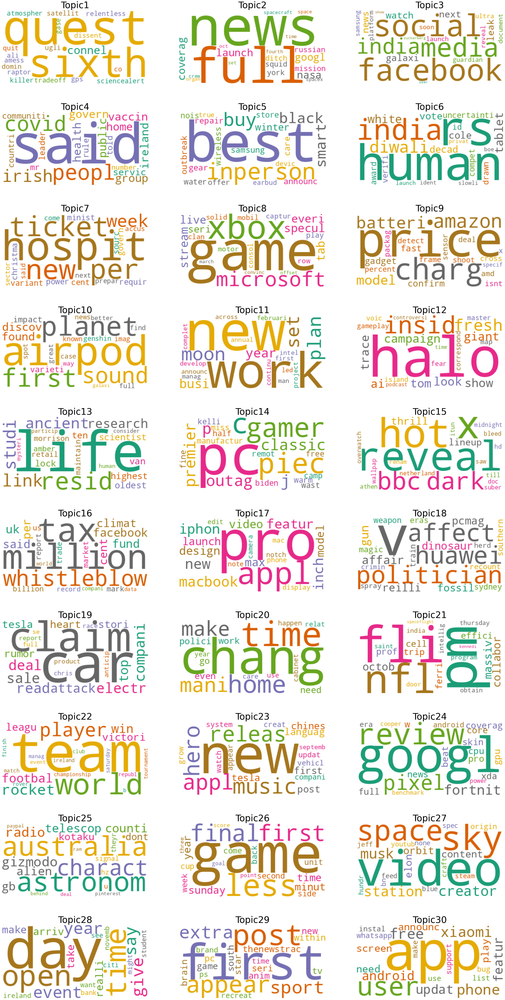

In [182]:
# import wordclouds
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# initiate wordcloud object
wc = WordCloud(background_color="white", colormap="Dark2", max_font_size=150, random_state=42)




# set the figure size
plt.rcParams['figure.figsize'] = [50, 100]

# Create subplots for each topic
for i in range(30):

    wc.generate(text=df_Topic["Topic Term"][i])

    plt.subplot(10, 3, i+1)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(df_Topic.index[i], size=50)

plt.show()

## Check Model perfromance with Topic Coherence measures

In [183]:


coherence= CoherenceModel(model=lda_model, texts=new_article,
                                    dictionary=id2word, coherence='c_v')
coherence_lda = coherence.get_coherence()
print('\nlLDA Coherence Score: ', coherence_lda)


lLDA Coherence Score:  0.45011987003232307


## Lets Visualize

In [184]:
# import pyLDAvis.gensim
import pyLDAvis.gensim_models
import pyLDAvis

pyLDAvis.enable_notebook(local=True)
vis = pyLDAvis.gensim.prepare(lda_model, corpus, id2word, mds="mmds", R=30)
vis


/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
19    -0.112375 -0.440853       1        1  17.633305
22     0.138920 -0.358451       2        1   8.854115
25    -0.294112 -0.347774       3        1   8.595593
27     0.229816 -0.328938       4        1   8.292450
3      0.348909 -0.309958       5        1   8.224732
16     0.407585 -0.153747       6        1   7.615261
10     0.420364 -0.037721       7        1   7.023682
6      0.024248 -0.400909       8        1   4.721471
15    -0.236077 -0.229081       9        1   3.531703
18    -0.106812 -0.283669      10        1   3.291513
2     -0.366553 -0.025434      11        1   2.498081
9     -0.362436  0.111020      12        1   2.372568
21    -0.372596 -0.125272      13        1   2.219605
29     0.061739 -0.132283      14        1   1.958396
28     0.336317  0.231603      15        1   1.507306
1     -0.292375  0.240371      16        1   1.399833
8     -0.140884  0.359818      17        1   1.355033
23    -0.257181  0.119176      18        1   1.290289
11     0.172219 -0.007229      19        1   1.062143
12     0.228752  0.112604      20        1   0.902591
26     0.179907  0.192218      21        1   0.796800
13     0.148970  0.272638      22        1   0.770477
7     -0.151827  0.218368      23        1   0.738138
20     0.094575  0.346495      24        1   0.735770
24    -0.025129  0.231303      25        1   0.630871
4     -0.012677  0.344685      26        1   0.625705
17    -0.072389  0.042402      27        1   0.439526
5      0.048964  0.126716      28        1   0.424400
14    -0.039400  0.121670      29        1   0.246740
0      0.001541  0.110231      30        1   0.241904, topic_info=        Term        Freq       Total Category  logprob  loglift
679      pro  867.000000  867.000000  Default  30.0000  30.0000
1155    game  504.000000  504.000000  Default  29.0000  29.0000
72     first  833.000000  833.000000  Default  28.0000  28.0000
838    googl  500.000000  500.000000  Default  27.0000  27.0000
913     appl  851.000000  851.000000  Default  26.0000  26.0000
...      ...         ...         ...      ...      ...      ...
0     absorb    0.017358    8.465819  Topic30  -9.9279  -0.1654
1      advic    0.017358   23.497074  Topic30  -9.9279  -1.1862
2      advis    0.017358   26.929538  Topic30  -9.9279  -1.3225
4     affect    0.017358   58.437286  Topic30  -9.9279  -2.0973
5      agent    0.017358   11.120051  Topic30  -9.9279  -0.4381

[1441 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
909       4  0.977055     absolut
0         3  0.826854      absorb
1033      2  0.099510        abus
1033     10  0.862418        abus
3613     15  0.683620       accid
...     ...       ...         ...
660      21  0.801654      youtub
5035     28  0.549452          yr
1921      4  0.984321     zealand
1366     14  0.945699        zoom
2629     11  0.987249  zuckerberg

[2281 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[20, 23, 26, 28, 4, 17, 11, 7, 16, 19, 3, 10, 22, 30, 29, 2, 9, 24, 12, 13, 27, 14, 8, 21, 25, 5, 18, 6, 15, 1])

### As it can be seen good bit of overlap between some clusters. Lets fine Tune

In [185]:
def coherence_Score(dictionary, corpus, texts, limit, start=2, step=3):


    Score = []
    modelCollection = []
    for topics in range(start, limit, step):
        model = models.LdaMulticore(corpus=corpus,
                                    num_topics=topics,
                                    id2word=id2word,
                                      random_state=100,
                                      chunksize=100,
                                      passes=10,
                                      per_word_topics=True)
        modelCollection.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        Score.append(coherencemodel.get_coherence())

    return modelCollection, Score




In [186]:
modelCollection, Score = coherence_Score(dictionary=id2word, corpus=corpus, texts=new_article,
                                                        start=2, limit=50, step=1)

## Looking at the plot of our scores

Text(0, 0.5, 'Coherence score')

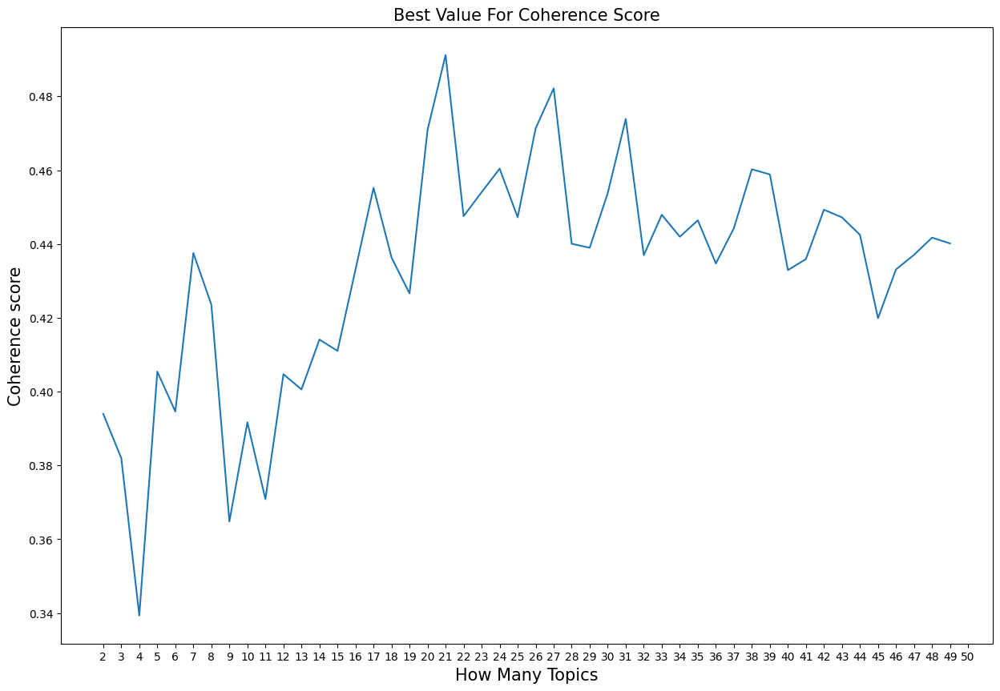

In [187]:
start=2; end=50;
plt.rcParams['figure.figsize'] = [15, 10 ]
plt.plot(range(start, end), Score)
plt.title("Best Value For Coherence Score", size=15)
plt.xticks(np.arange(2,51))
plt.xlabel("How Many Topics", size=15)
plt.ylabel("Coherence score", size=15)


In [188]:
BestScore= Score.index(max(Score))
optimal_model = modelCollection[BestScore]

print(f'''{BestScore} topics gives the highest coherence score \
of {Score[BestScore]}''')

19 topics gives the highest coherence score of 0.4911963518675768


In [189]:


pyLDAvis.enable_notebook(local=True)
vis = pyLDAvis.gensim.prepare(optimal_model, corpus, id2word, mds="mmds", R=30)
vis


/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
19    -0.388569 -0.223789       1        1  33.289584
16    -0.234121 -0.363522       2        1  12.499868
10    -0.273629  0.338842       3        1  11.452231
6     -0.395475  0.166506       4        1   8.642969
9     -0.386779 -0.019152       5        1   8.036442
15    -0.255314 -0.115504       6        1   4.244906
18     0.025868 -0.400889       7        1   3.931775
3      0.297971 -0.314329       8        1   3.508606
20     0.024594 -0.265312       9        1   2.168106
13     0.210455  0.347322      10        1   1.803134
4     -0.049988 -0.092133      11        1   1.700796
11    -0.025316  0.333736      12        1   1.451020
17    -0.111849  0.169005      13        1   1.381727
0      0.110842  0.247160      14        1   1.155636
2      0.171881 -0.132972      15        1   0.993553
8      0.309602 -0.061252      16        1   0.893771
7      0.301982  0.049642      17        1   0.812980
12     0.279001  0.157841      18        1   0.805003
14     0.172959  0.018267      19        1   0.467843
1      0.134666  0.102118      20        1   0.391801
5      0.081221  0.058415      21        1   0.368248, topic_info=             Term        Freq       Total Category  logprob  loglift
1155         game  599.000000  599.000000  Default  30.0000  30.0000
679           pro  761.000000  761.000000  Default  29.0000  29.0000
339          said  908.000000  908.000000  Default  28.0000  28.0000
1439           pm  380.000000  380.000000  Default  27.0000  27.0000
913          appl  772.000000  772.000000  Default  26.0000  26.0000
...           ...         ...         ...      ...      ...      ...
2005          hot    5.149315   29.925240  Topic21  -4.6556   3.8443
5570  controversi    2.069949   22.206067  Topic21  -5.5669   3.2313
7747         gang    0.024392    0.952094  Topic21 -10.0079   1.9398
3825       payday    0.024390    0.952053  Topic21 -10.0080   1.9397
4028      anywher    0.024389    0.952053  Topic21 -10.0081   1.9397

[1019 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
909      16  0.958706     absolut
593       1  0.264122      access
593       3  0.728976      access
236       1  0.084938      accord
236       2  0.092659      accord
...     ...       ...         ...
660       2  0.967324      youtub
5035     21  0.697800          yr
1921     17  0.981357     zealand
1366     13  0.885804        zoom
2629      7  0.945910  zuckerberg

[1519 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[20, 17, 11, 7, 10, 16, 19, 4, 21, 14, 5, 12, 18, 1, 3, 9, 8, 13, 15, 2, 6])

/tmp/ipykernel_2414/2368743253.py:23: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  wc.generate(text=df_Topic["Topic Term"][i])


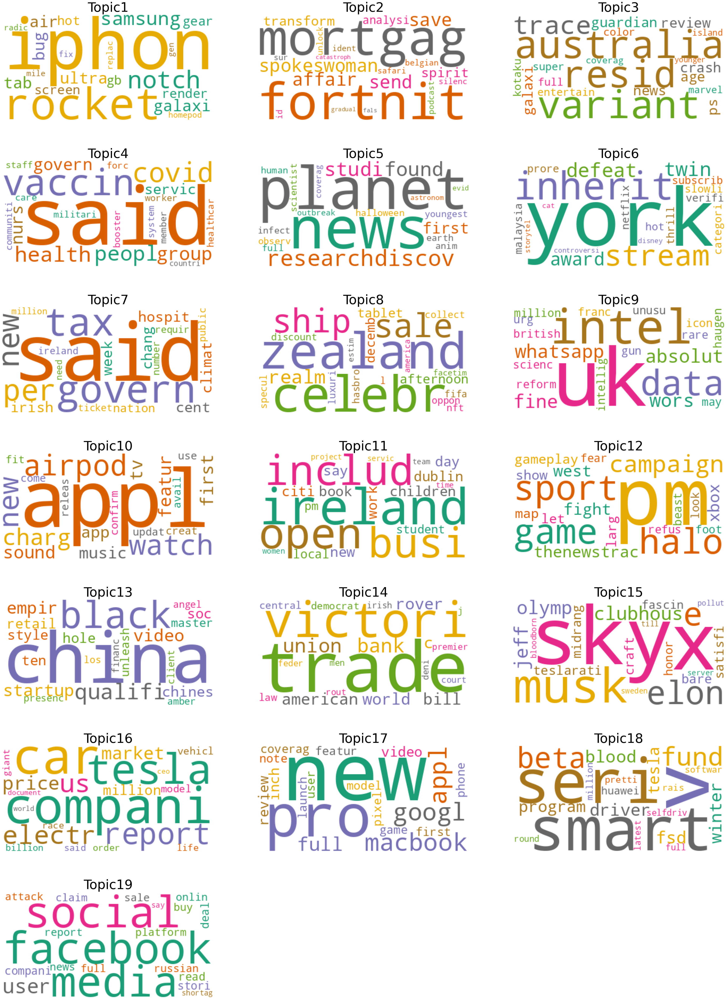

In [198]:
topics=[]
for i in range(0,BestScore):
    topic_list=[]
    for term, wt in optimal_model.show_topic(i, topn=20):
        topic_list.append((term, round(wt,3)))
    topics.append(topic_list)

df_Topic= pd.DataFrame([', '.join([term for term, wt in topic]) for topic in topics],
                         columns = ['Topic Term'],
                         index=['Topic'+str(t) for t in range(1, optimal_model.num_topics-1)] )

wc = WordCloud(background_color="white", colormap="Dark2", max_font_size=150, random_state=42)




# set the figure size
plt.rcParams['figure.figsize'] = [50, 100]


for i in range(BestScore):

    wc.generate(text=df_Topic["Topic Term"][i])

    plt.subplot(10, 3, i+1)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title(df_Topic.index[i], size=50)
